## The face detection

Before we start, we must import some libraries.

In [5]:
%pip install opencv-python

In [6]:
import cv2

We then need to find a face recognition algorithm that will ensure the smile can be well detected in the future. For this project, I will be using the pre-trained model called Haar cascade algorithm. It is a machine learning algorithm that uses a series of simple visual features, called Haar-like features, to identify objects in images. These features are used to construct a classifier, which can be trained to recognize a specific type of object, such as a face or a car.
What actually happens with this algorithm is, the selected image / frame gets through a process of searching for a face using small squares within the image to identify it and once it's found it gets the coordinates of the square that found the face - which then gets displayed on the image. The face classifier contains data about what a face looks like based on the brightness levels in the grayscale.

In [ ]:
# Face classifier
face_detector = cv2.CascadeClassifier('haarcascade_frontalface_default.xml')

# Obtain the webcam feed
webcam = cv2.VideoCapture(0)

# Show the current frame (going frame by frame in a loop)
while True:
    # Read only the current frame from the webcam
    # Get the tuple containing a Boolean output for whether it's successfully read and then the actual frame
    successful_frame_read, frame = webcam.read()

    # Abort in case there is an error
    if not successful_frame_read:
        break
        
    cv2.imshow('Smile detector', frame)

    # Keep the window open until a key is pressed
    # Updated every 1ms - close to real time
    cv2.waitKey(1)

This part of code can be executed and displayed with the "imshow" function from the opencv module. Another important function is the "waitKey" which allows us to modify the time it takes to refresh so instead of working with a single frame we can get near the real-time webcam footage. One of the captured frames then looks like this:

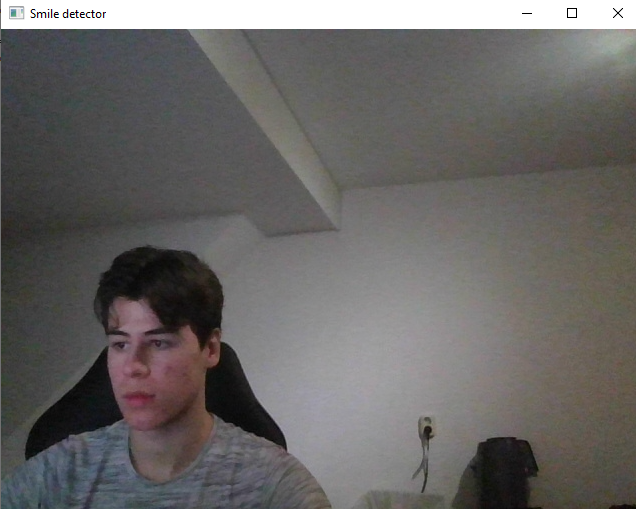

The webcam capture is refreshed (closed and captured again in a loop) every 1ms.

The next part of code includes the rgb to grayscale color conversion which is necessary and a requirement for opencv, but also helps with the facial recognition a lot.

In [ ]:
    # Convert to grayscale (black & white) because the facial recognition ability is increased since RGB has 3 channels while the grayscale has only 1
    frame_grayscale = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY) 
    
    # Show the frame
    cv2.imshow('Smile detector', frame_grayscale)

    # Keep the window open until a key is pressed
    # Updated every 1ms - close to real time
    cv2.waitKey(1)

The frame captured now looks like this:

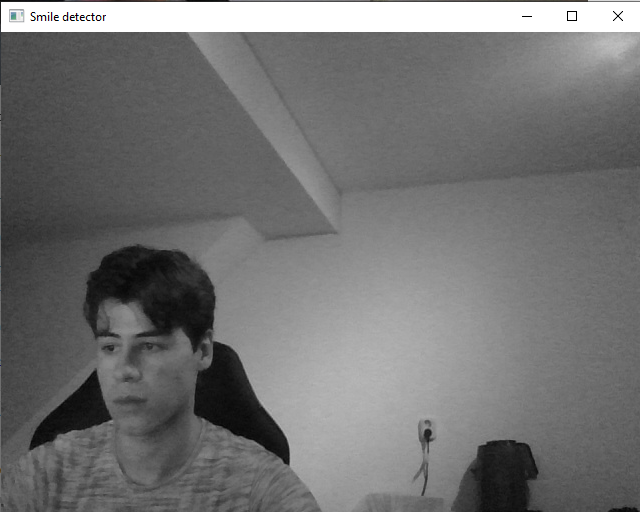


Now we just have to pop the grayscale frame into the classifier for faces and it will give out the coordinates of the faces, and draw a rectangle with the given coordinates. The next line of code refers to the actual face detection and it goes right before the grayscale conversion.

The "detectMultiScale" function gives output as an array of points of where all the faces are in the image given by the parameter within the brackets.

In [ ]:
    # Detect the faces
    faces = face_detector.detectMultiScale(frame_grayscale)

I also added a new line of code in the loop just to print and show what is actually happening in the "faces" list

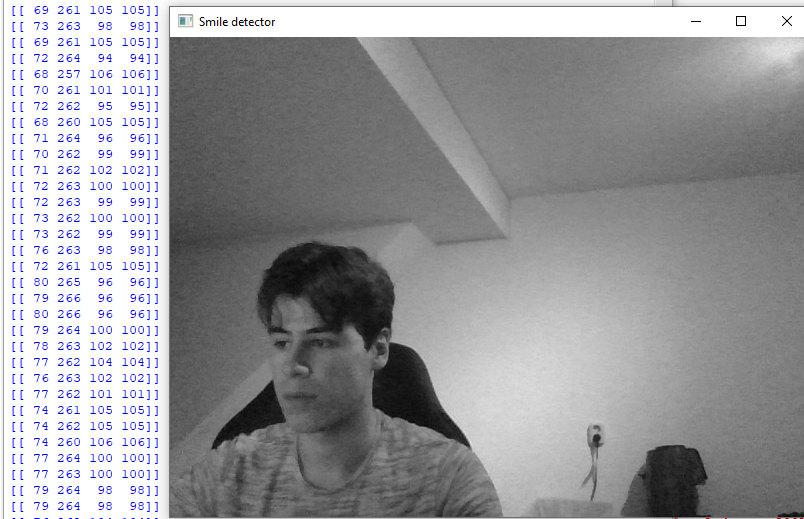

From this, everything that's left to do in order to have an algorithm that can detect faces is creating a rectangle from these four coordinates each millisecond.

We can do this by going through all the given parameters, the top left point, bottom right point, the width and the height of the rectangle, and later using the function "rectangle" to draw the rectangle on the frame.

In [ ]:
    for (x, y, w, h) in faces:

        # Draw a rectangle around the face
        cv2.rectangle(frame, (x,y), (x+w, y+h), (100, 200, 50), 4)
        

Since the grayscale is only used for the calculations and better facial recognition, the rectangle isn't drawn on the grayscale frame but rather on the actual frame which we show as the webcam capture. Once this is done, the main loop looks like this:

In [ ]:
while True:
    # Read the current frame from the webcam
    successful_frame_read, frame = webcam.read()

    # Abort in case there is an error
    if not successful_frame_read:
        break

    # Convert to grayscale (black & white)
    frame_grayscale = cv2.cvtColor(frame, cv2.COLOR_BGR2GRAY)

    # Detect the faces
    faces = face_detector.detectMultiScale(frame_grayscale)

    # Run the smile detection within each of those faces
    for (x, y, w, h) in faces:

        # Draw a rectangle around the face
        cv2.rectangle(frame, (x,y), (x+w, y+h), (100, 200, 50), 4)
        
    # Show the frame
    cv2.imshow('Smile detector', frame)

    # Wait 1ms before closing the window
    cv2.waitKey(1)

The webcam capture frame now looks like this:

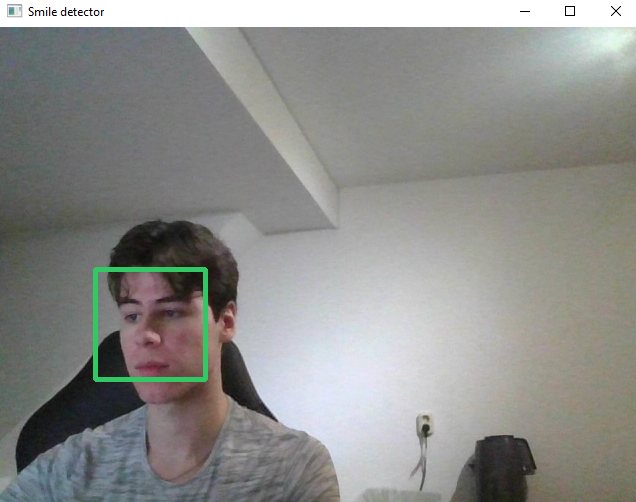

However, there is a small problem with the accuracy of the rectangle's position and detecting actual faces since in the example below it's clear that there is only one face whilst the program says there are two.

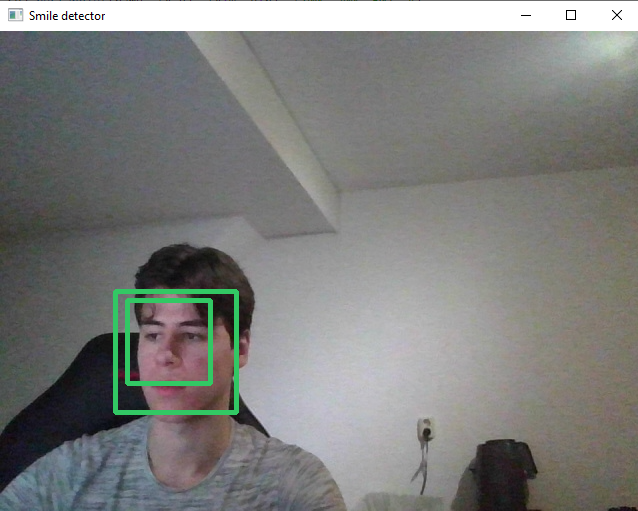 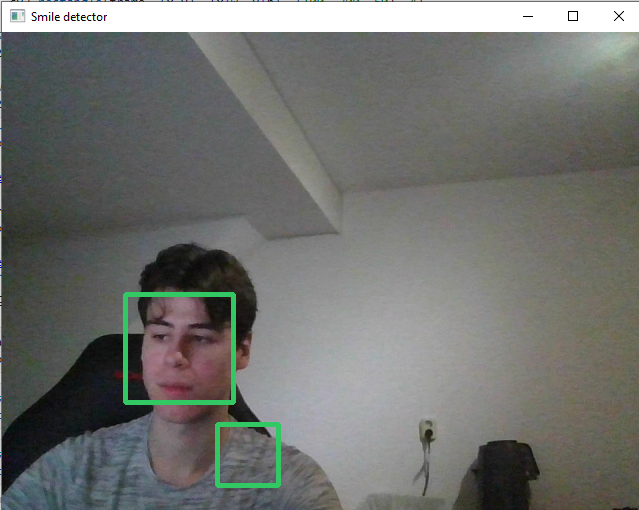

Another problem is it doesn't always detect the face and this I will test with an image input so I can test out different algorithms used for facial recognition in case there are some that work better. 

In order to test this algorithm's accuracy I chose some group photos of mine which I thought would be tricky to detect and shape a rectangle well around it.

The Haarcascade algorithm was tested with the following code:
- disclaimer: for each of the four images, the corresponding number was used.

In [ ]:
import cv2
from PIL import Image

# Obtaining the image by opencv function and resizing it for the sake of the algorithm then turning it from RGB into grayscale
image1 = cv2.imread("C:/Users/reibo/OneDrive/Dokumenti/dokumenti za faks/year 3/smile detection/group photos/image1.jpg")
image1 = cv2.resize(image1, None, fx=0.25, fy=0.25)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# The face classifier
face_cascade = cv2.CascadeClassifier("haarcascade_frontalface_default.xml")

# Detect faces
faces = face_cascade.detectMultiScale(image1_gray, scaleFactor=1.2, minNeighbors=5)
image = image1.copy()

# Draw rectangles on each face
for (x, y, w, h) in faces:
    image = cv2.rectangle(image, (x,y), (x+w, y+h), (0,0,255), 2)

# Convert back to RGB
image = cv2.cvtColor(image, cv2.COLOR_BGR2RGB)

# Show the image
Image.fromarray(image).save('image11.jpg') 


This is what the output file for the 1st image looked like:

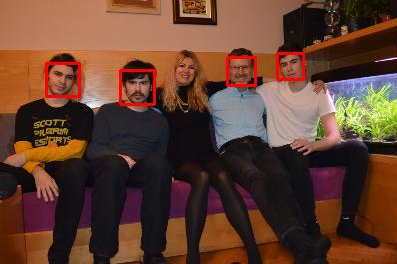

This is what the output file for the 2nd image looked like:

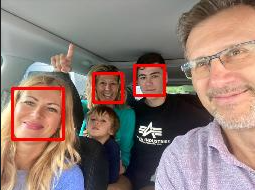

This is what the output file for the 3rd image looked like:

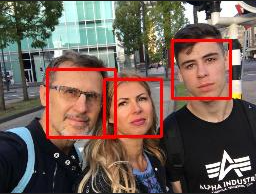

This is what the output file for the 4th image looked like:

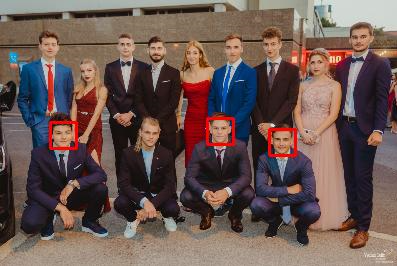

The biggest issue here is that some faces aren't recognized. This is, of course, unacceptable and maybe another algorithm should be used. However, I drastically improved the accuracy by changing the dimensions of the resized image to 50x50 instead of 25x25. This improved the detection and for instance, the last photo now looks like this:

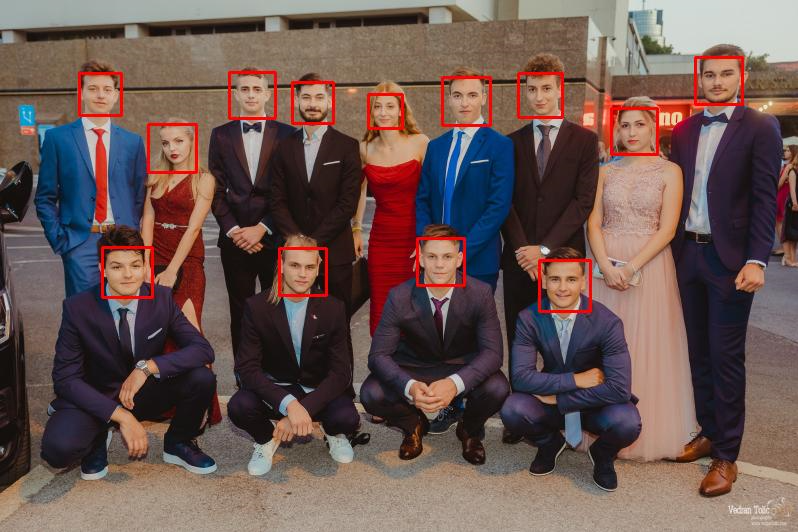

I proceeded to change this for every picture that needed more resolution to accurately detect all faces and the 1st image now looks like this:

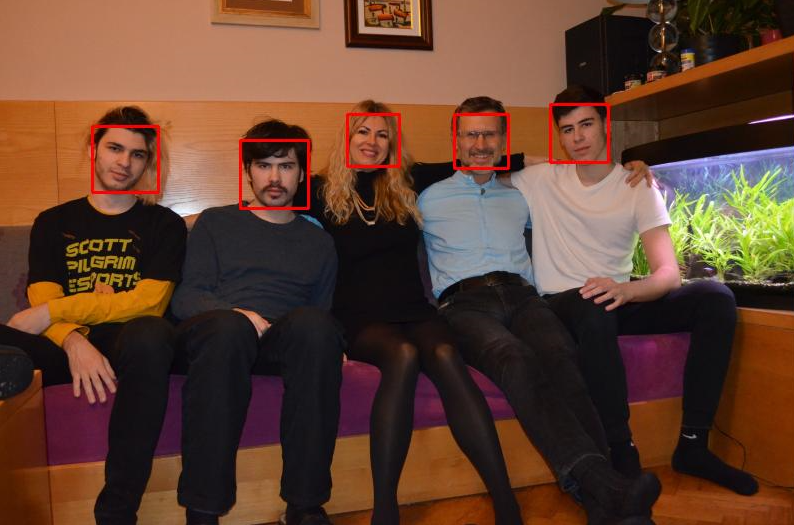 

However, the 2nd picture is now worse with only two faces detected, so I know there is also a potential downside to using a resolution this big.
Image 2 for reference:

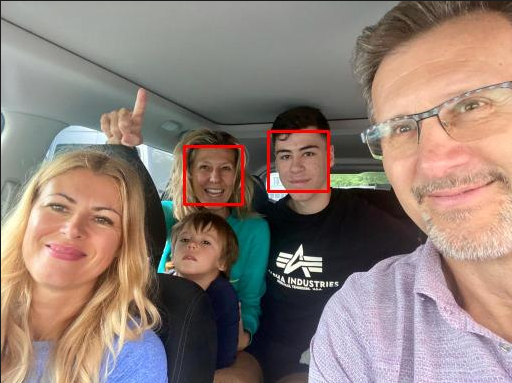



Another algorithm can be used such as HOG. Histogram of Oriented Gradients, also known as HOG, is a feature descriptor like the Canny Edge Detector, SIFT (Scale Invariant and Feature Transform). It is used in computer vision and image processing for the purpose of object detection.

In order to use it for facial recognition, dlib library is used.

In [ ]:
# Import the libraries
import dlib
import cv2

# Obtaining the image by opencv function and resizing it for the sake of the algorithm then turning it from RGB into grayscale
image1 = cv2.imread("C:/Users/reibo/OneDrive/Dokumenti/dokumenti za faks/year 3/smile detection/group photos/image1.jpg")
image1 = cv2.resize(image1, None, fx=0.50, fy=0.50)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# The face classifier
face_detector = dlib.get_frontal_face_detector()

# Detect faces
detections = face_detector(image1, 1)
image = image1.copy()

# Draw rectangles on each face
for (i, rect) in enumerate(detections):
    x = rect.left()
    y = rect.top()
    w = rect.right() - x
    h = rect.bottom() - y
    cv2.rectangle(image, (x, y), (x + w, y + h), (0, 255, 0), 2)

# Show the image
cv2.imshow("Image", image)


The algorithm's results on all 4 pictures used with 50x50 resizing are the following:

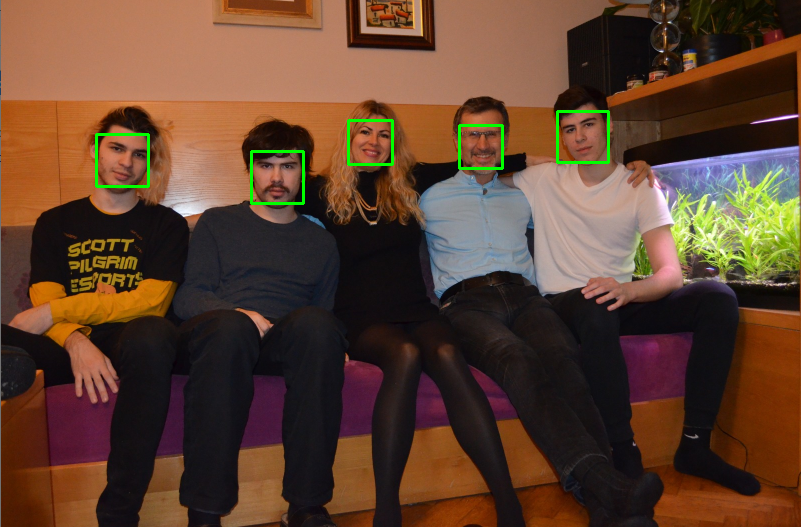 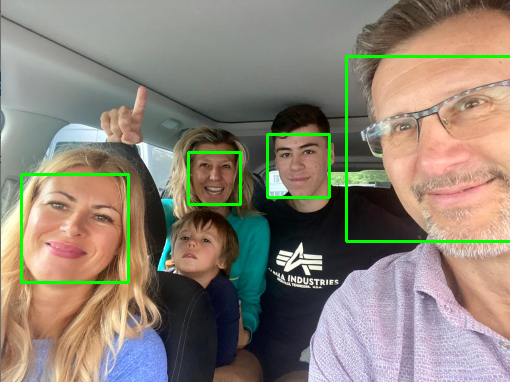

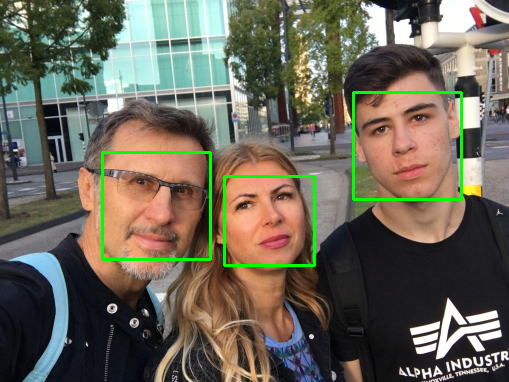 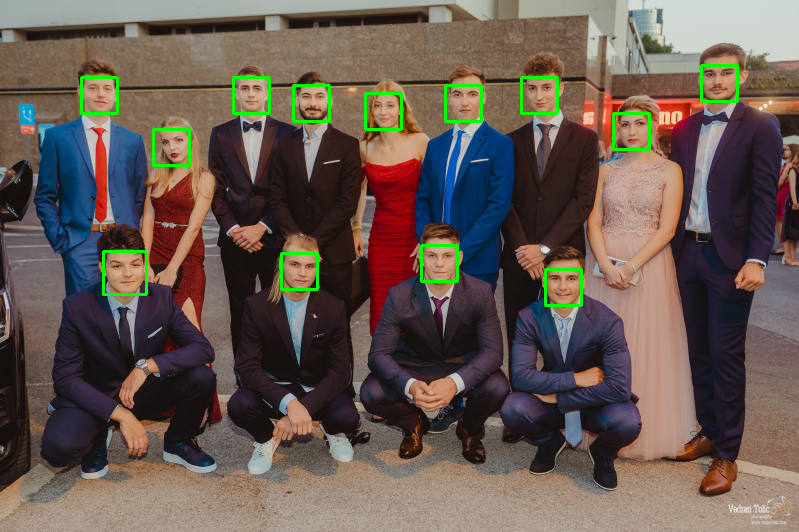

The HOG algorithm seems to be working even better than the Haar cascade one but still there is one face not detected and I, as a perfectionist, would really like for it to also get detected so it's time to try another algorithm.

For the next algorithm, I decided to use MTCNN. MTCNN (Multi-Task Cascaded Convolutional Neural Networks) is an algorithm for detecting faces in digital images. It is a deep learning technique that uses a cascade of convolutional neural networks to detect faces in images and videos. The MTCNN algorithm can detect and localize faces, detect facial landmarks (eyes, nose, and mouth) and draw bounding boxes around faces in an image.

The altered code using this pre-trained model looks like this:

In [ ]:
# Import the libraries
import cv2
from mtcnn import MTCNN

# Obtaining the image by opencv function and resizing it for the sake of the algorithm then turning it from RGB into grayscale
image1 = cv2.imread("C:/Users/reibo/OneDrive/Dokumenti/dokumenti za faks/year 3/smile detection/group photos/image1.jpg")
image1 = cv2.resize(image1, None, fx=0.48, fy=0.48)
image1_gray = cv2.cvtColor(image1, cv2.COLOR_BGR2GRAY)

# The face classifier
face_detector = MTCNN()

# Detect faces
detections = face_detector.detect_faces(image1)
image = image1.copy()

# Draw rectangles on each face
for face in detections:
    x, y, w, h = face['box']
    cv2.rectangle(image, (x, y), (x + w, y + h), (255, 0, 0), 2)

# Show the image
cv2.imshow("Image", image)

# Cleanup
cv2.waitKey(0)
cv2.destroyAllWindows()


The only issue I had was the 50x50 dimensions of the resized image seemed like a bit too much so the big face of my father in the 2nd image wasn't detected. I altered the dimensions  to 48x48 and now it works like a charm.

The images using this algorithm are the following:

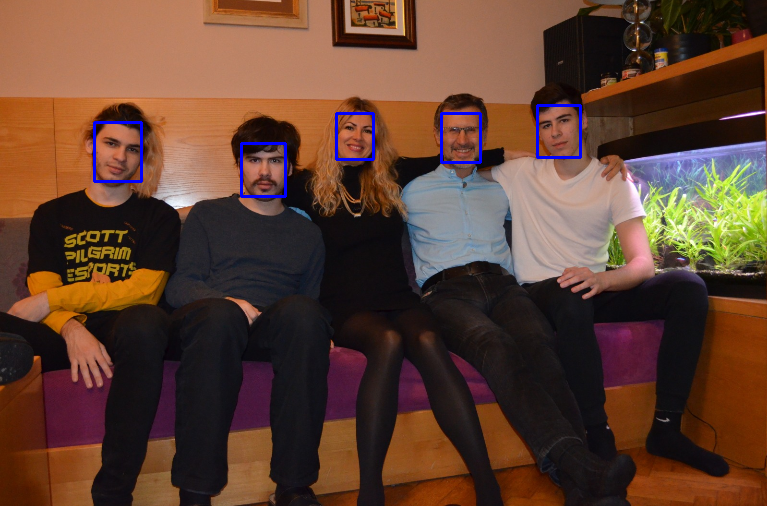 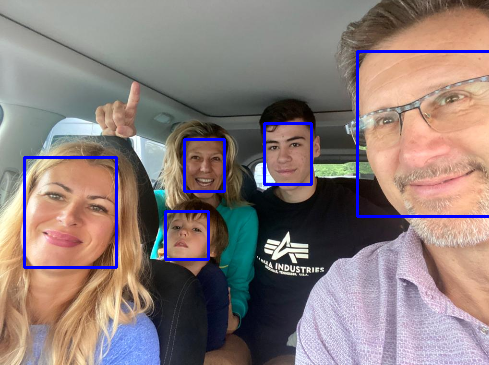 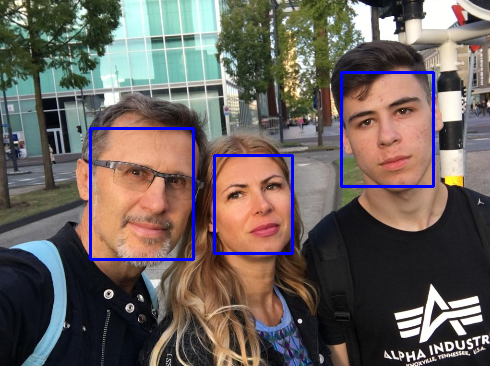 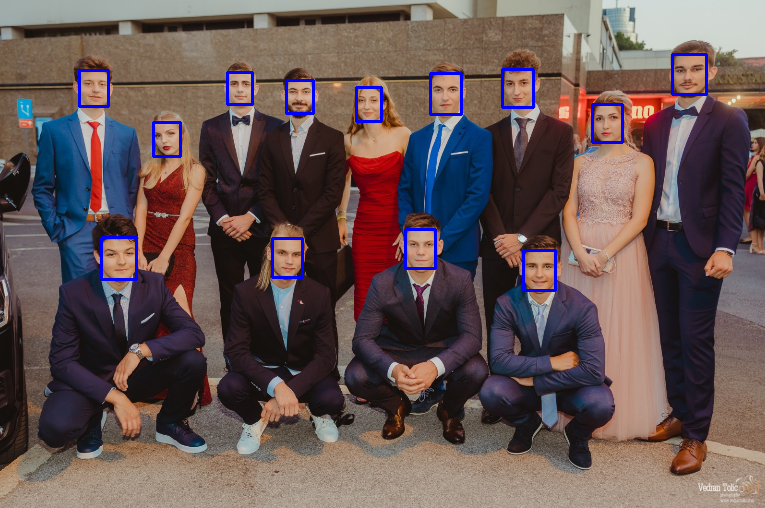

As we can already see, all the faces are detected, unlike before, so now a smile detecting algorithm should be created upon this.